# Funkcjonalność biblioteki:

-Rysowanie bounding boxów na zdjęciach i filmach wraz z wyświetleniem szczegółowych informacji:
   •Id
   •Klasa
   •Confidence score
   •Porównanie z Ground Truth:
      oWyświetlenie IntersectionOverUnion
      oInformacji - TP, FP, FN
   •...
-Rysowanie „ścieżek” trackera
-Logowanie/Wyświetlanie statystyk detektora/trackera:
   •RealTime/Sumarycznie ilość wykrytych obiektów z podziałem na klasy
   •mAP@50, mAP@[.50:.05:.90] itd.
   •RealTime/Sumarycznie TP, FP, FN
   •RealTtime/Sumarycznie AVG Precission, Recall
-Przyjmowanie inputu w wielu popularnych formatach:
   •COCO
   •Pascal VOC
   •Darknet YOLO
   •...
-Rysowanie masek – Polygional Segmentation (ze szczegółowymi informacjami jw.)

In [1]:
# 2 + 2 + 0.5
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from os import listdir
from os.path import isfile, join
from random import random, randint, seed
seed(1)

In [2]:
TEST_IMAGES_PATH = r'C:\Users\gasie\projects\detVisLib\AFO_SAMPLES\images'
TEST_GT_PATH = r'C:\Users\gasie\projects\detVisLib\AFO_SAMPLES\gt'
TEST_YOLO_DETS_PATH = r'C:\Users\gasie\projects\detVisLib\AFO_SAMPLES\yolo_v3_dets'
TEST_RESULTS_PATH = r'C:\Users\gasie\projects\detVisLib\AFO_SAMPLES\results'

In [3]:
classes_dict = {
    0 : 'Small Object',
    1 : 'Large Object'
}

In [4]:
def load_images(dir_path):
    images_files = [f for f in listdir(dir_path) if isfile(join(dir_path, f))]
    images = []
    for file_name in images_files:
        image_data = {}
        image_data['img'] = cv2.cvtColor(cv2.imread(dir_path + '/' + file_name,cv2.COLOR_BGR2RGB),cv2.COLOR_BGR2RGB)
        image_data['h'] = image_data['img'].shape[0]
        image_data['w'] = image_data['img'].shape[1]
        image_data['name'] = file_name
        images.append(image_data)
    return images

In [5]:
loaded_images = load_images(TEST_IMAGES_PATH)
# img = cv2.imread(TEST_IMAGES_PATH+ '/a_324.jpg',cv2.COLOR_BGR2RGB)
# height, width, channels = img.shape
# rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [6]:
def print_images(images):
    for nr in range(len(images)):
        plt.figure(figsize=(20,20))
        plt.imshow(images[nr]['img'])

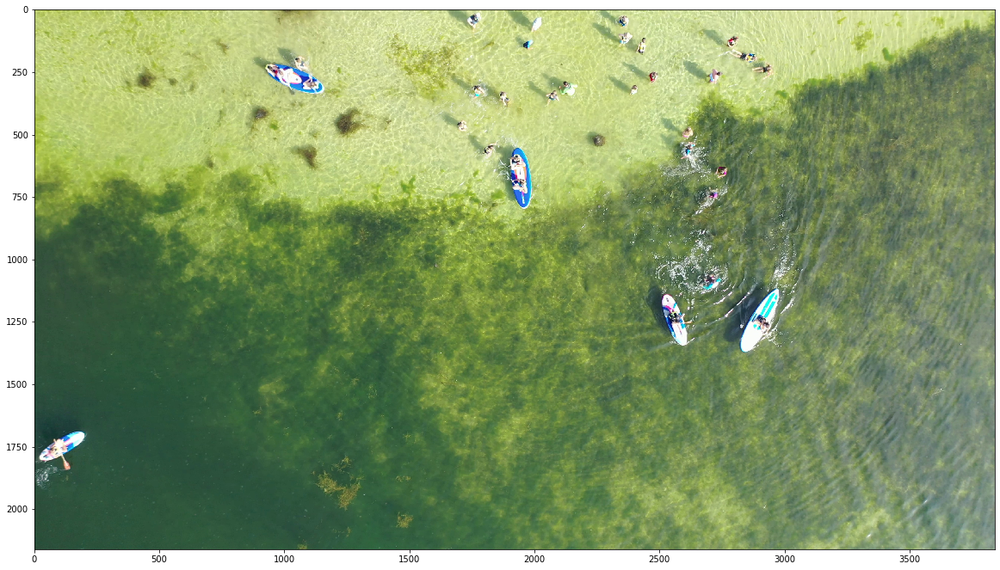

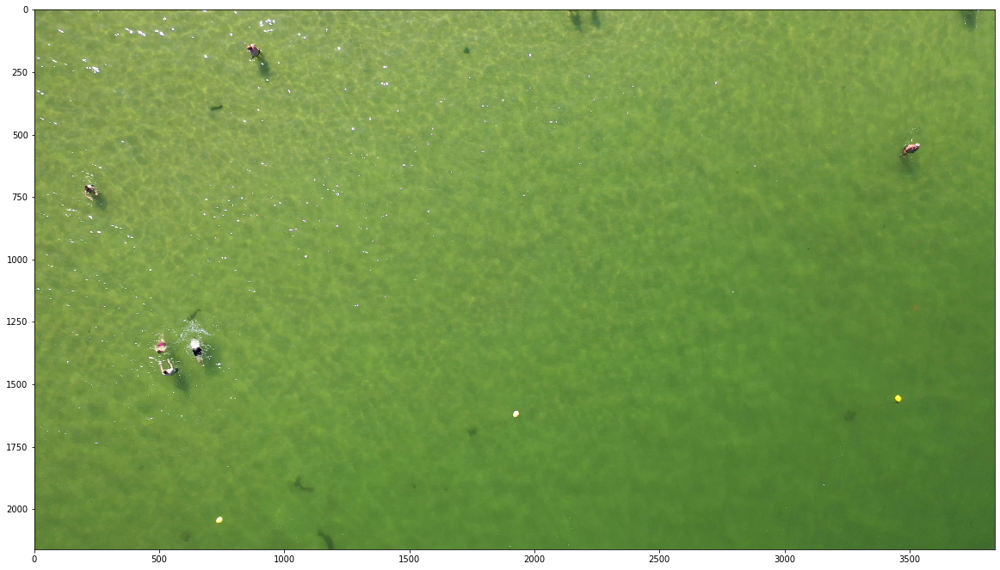

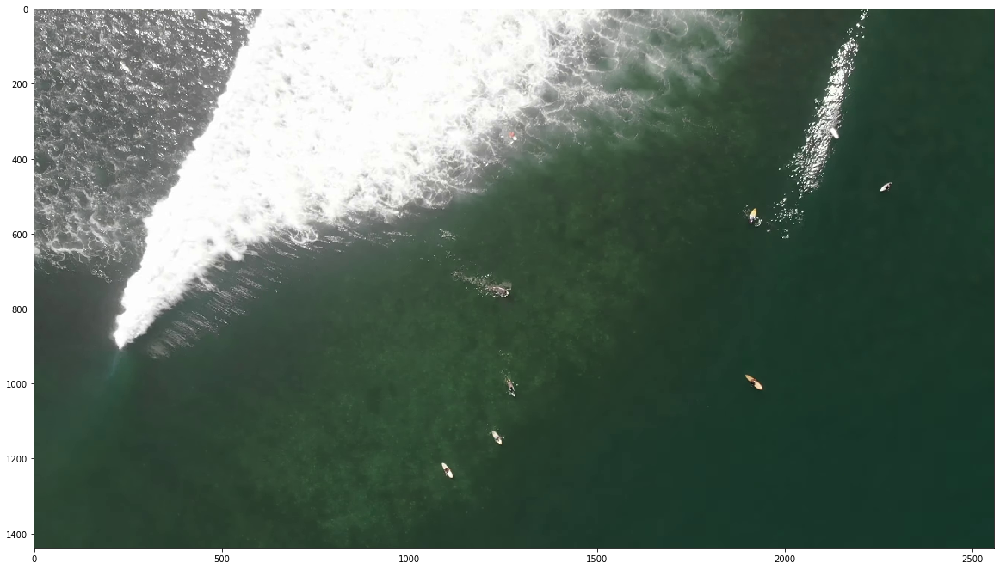

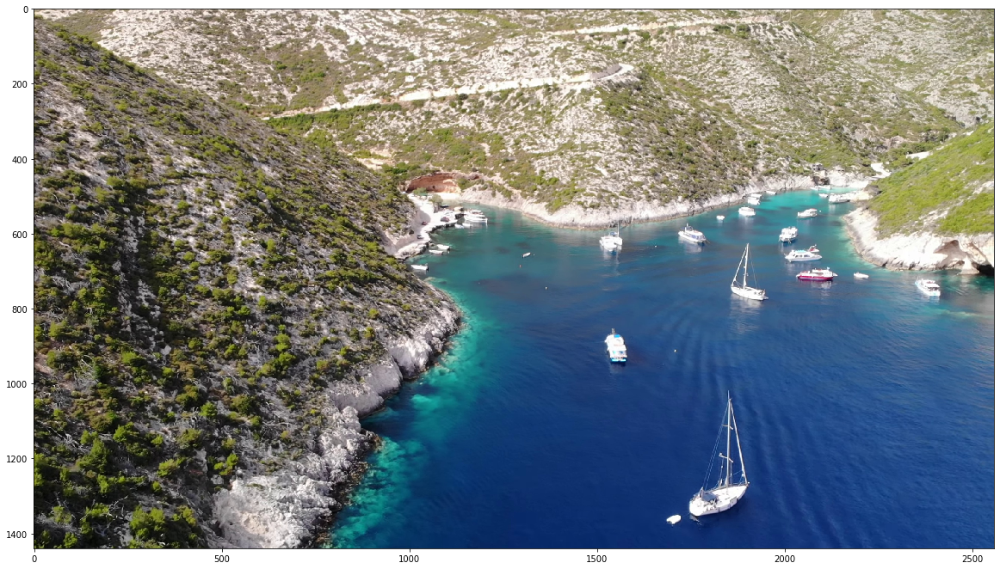

In [7]:
print_images(loaded_images)

In [8]:
def read_detections(dir_path):
    dets_files = [f for f in listdir(dir_path) if isfile(join(dir_path, f))]
    dets_files_content = []
    for file_name in dets_files:
        file = open(dir_path + '\\' + file_name, 'r') 
        dets_files_content.append(file.readlines())
    return dets_files_content

In [9]:
gt_files_content = read_detections(TEST_GT_PATH)
yolo_files_content = read_detections(TEST_YOLO_DETS_PATH)

In [10]:
def text_with_background(image, text, color, coords, h=50):
    x = coords[0]
    y = coords[1]
    w = len(text) * 20
    # Draw black background rectangle
    cv2.rectangle(image, (x, y), (x + w, y - h), (0,0,0), -1)
    # Add text
    cv2.putText(image, text, (x + int(w/10),y - int(h/3)), cv2.FONT_HERSHEY_SIMPLEX, 1, color, 4)

In [ ]:
def bb_iou(boxA, boxB):
	# determine the (x, y)-coordinates of the intersection rectangle
	xA = max(boxA[0], boxB[0])
	yA = max(boxA[1], boxB[1])
	xB = min(boxA[2], boxB[2])
	yB = min(boxA[3], boxB[3])
	# compute the area of intersection rectangle
	interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
	# compute the area of both the prediction and ground-truth
	# rectangles
	boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
	boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
	# compute the intersection over union by taking the intersection
	# area and dividing it by the sum of prediction + ground-truth
	# areas - the interesection area
	iou = interArea / float(boxAArea + boxBArea - interArea)
	# return the intersection over union value
	return iou

In [11]:
def plot_gt_pxywh(img, dets, color, thickness):
    for det in dets:
        det = det.split()
        width = img['w']
        height = img['h']
        top_left = (int((float(det[1]) - float(det[3])/2) * width), int((float(det[2]) - float(det[4])/2) * height))
        bottom_right = (int((float(det[1]) + float(det[3])/2) * width), int((float(det[2]) + float(det[4])/2) * height))
        img['img'] = cv2.rectangle(img['img'], top_left, bottom_right, color, thickness)
    return img

def plot_dets_xywh(img, dets,thickness, colors=[], conf_thresh = 0):
    if len(colors) == 0:
        for x in range(len(classes_dict)):
            colors.append((randint(0, 255),randint(0, 255),randint(0, 255)))
    for det in dets:
        det = det.split()
        if float(det[1]) >= conf_thresh:
            top_left = (int((float(det[2]) - float(det[4])/2)), int((float(det[3]) - float(det[5])/2)))
            bottom_right = (int((float(det[2]) + float(det[4])/2)), int((float(det[3]) + float(det[5])/2)))
            img['img'] = cv2.rectangle(img['img'], top_left, bottom_right, colors[int(det[0])], thickness)
            obj_label = classes_dict[int(det[0])] + ' ' + det[1]
            text_with_background(img['img'], obj_label, colors[int(det[0])], top_left)
    return img

In [15]:
for nr in range(len(loaded_images)):
    loaded_images[nr] = plot_gt_pxywh(loaded_images[nr], gt_files_content[nr], (53, 252, 23), 5)
    loaded_images[nr] = plot_dets_xywh(loaded_images[nr], yolo_files_content[nr], 5, [(255, 221, 0), (189, 46, 255)], 0.25)

In [16]:
def save_images(path, images):
    for nr in range(len(images)):
        cv2.imwrite(path + '//' + images[nr]['name'], cv2.cvtColor(images[nr]['img'], cv2.COLOR_RGB2BGR)) 

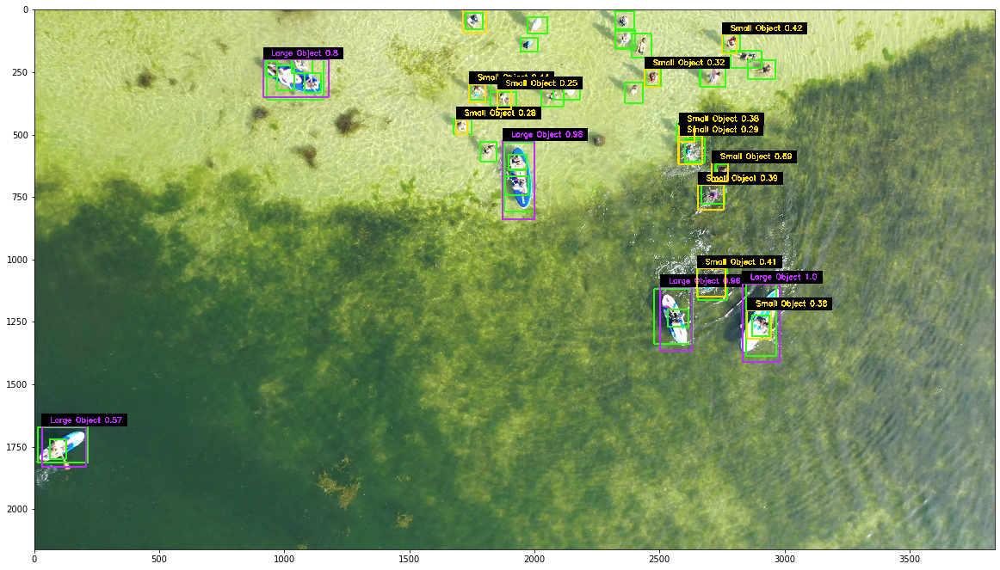

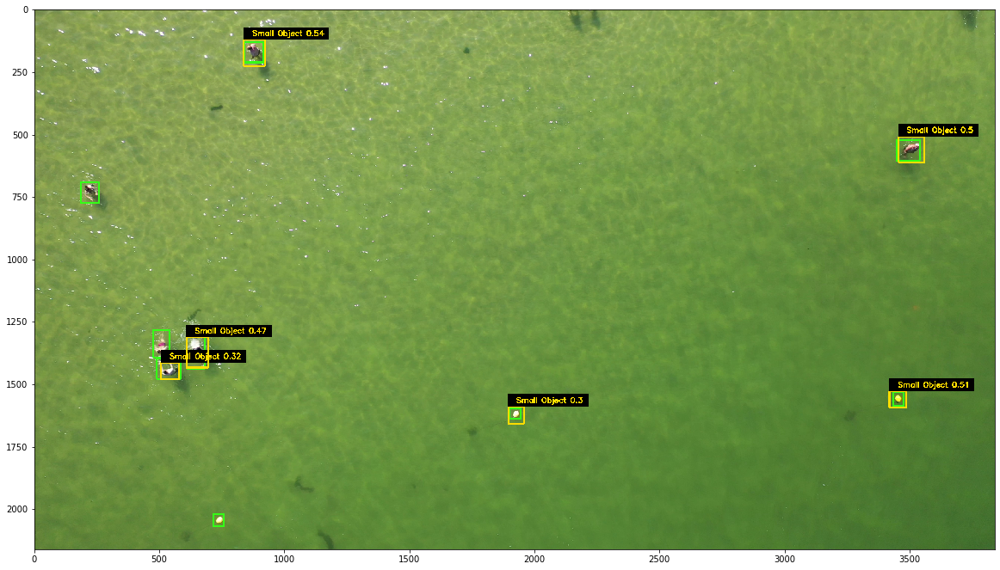

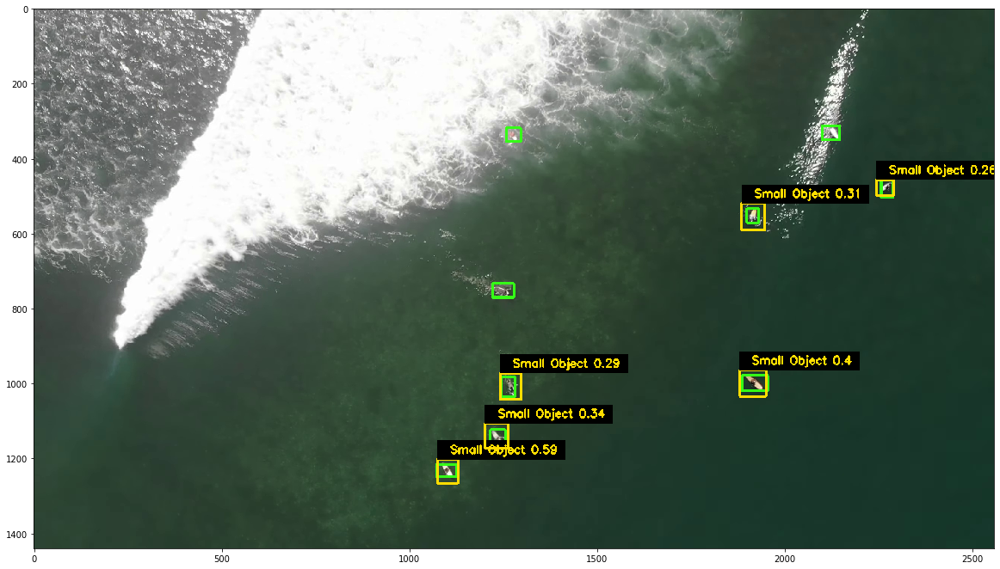

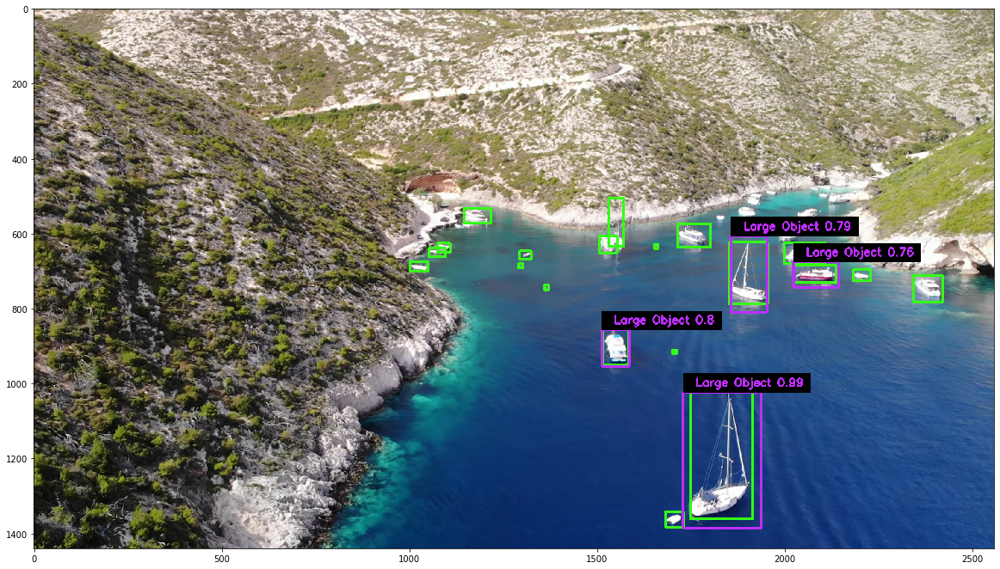

In [17]:
print_images(loaded_images)
save_images(TEST_RESULTS_PATH, loaded_images)